In [2]:
import torch 
torch.cuda.is_available()          

True

In [3]:
!gpustat

user                 Wed Oct 25 10:37:09 2023  470.82.01
[0] Quadro RTX 4000  | 30'C,   0 % |   199 /  7979 MB | gdm(39M) user(83M) user(55M)


In [4]:
import torch
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler

model_id = "runwayml/stable-diffusion-v1-5"
pipeline = DiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipeline = pipeline.to("cuda")
generator = torch.Generator("cuda").manual_seed(0)

pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [7]:
prompt = "task : we are making omelet reciepe reciepe step is BEAT eggs, water, salt and pepper in small bowl until blended"

In [8]:
from PIL import Image
def image_grid(imgs, rows=2, cols=2):
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid


In [14]:
def get_inputs(batch_size=1):
    generator = [torch.Generator("cuda").manual_seed(i+55) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20

    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}

In [5]:
pipeline.enable_attention_slicing()

In [18]:
torch.cuda.empty_cache()

In [30]:
torch.cuda.empty_cache()
!gpustat

user                 Wed Oct 25 11:34:17 2023  470.82.01
[0] Quadro RTX 4000  | 31'C,  70 % |  3940 /  7979 MB | elidandi_2211ai08(3741M) gdm(39M) user(83M) user(55M)


  0%|          | 0/20 [00:00<?, ?it/s]

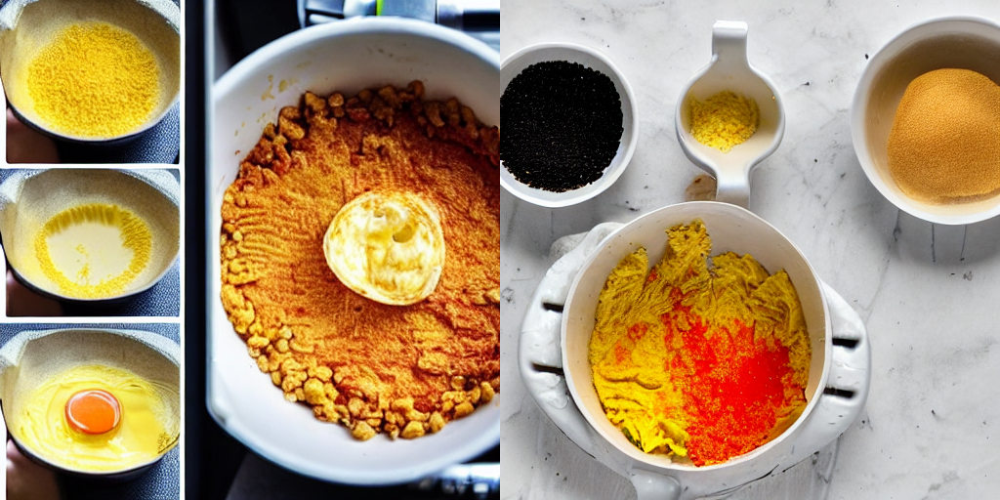

In [16]:
images = pipeline(**get_inputs(batch_size=2)).images
image_grid(images, rows=1, cols=2)

  0%|          | 0/20 [00:00<?, ?it/s]

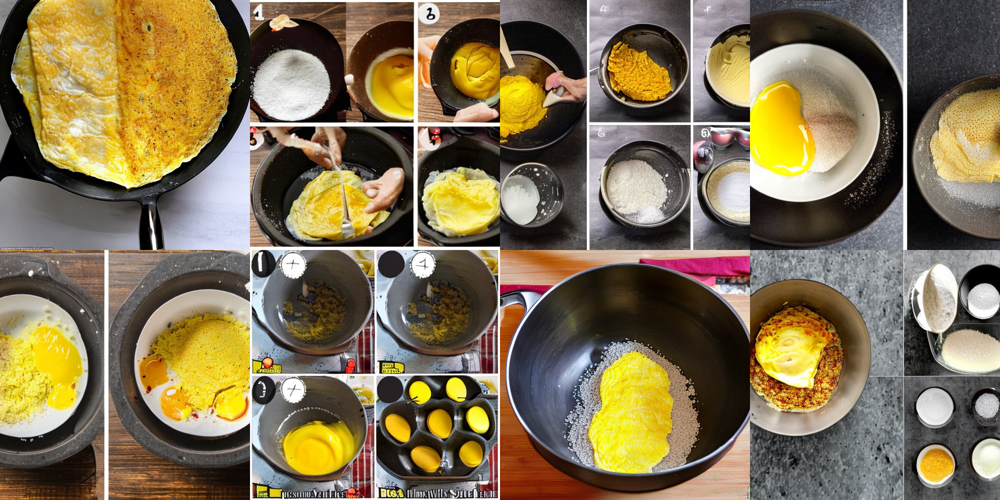

In [8]:
from diffusers import AutoencoderKL

vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse", torch_dtype=torch.float16).to("cuda")
pipeline.vae = vae
images = pipeline(**get_inputs(batch_size=8)).images
image_grid(images, rows=2, cols=4)

  0%|          | 0/25 [00:00<?, ?it/s]

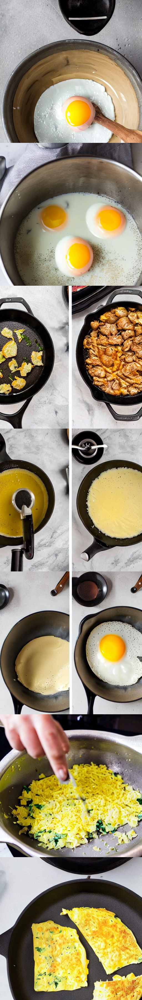

In [28]:
# prompts =['Preheat oven to 350 degrees F (175 degrees C). Grease and flour 2 loaf pans.',
#         'Sift flour, baking soda, cinnamon, and salt together in a large bowl; make a well in the center.',
#         'Whisk eggs, butter, sugar, and vanilla extract together in a separate bowl. Fold mango, coconut, and walnuts into the egg mixture; pour resulting mixture into the well in the center of the flour and mix well. Pour batter into prepared loaf pans and let sit at room temperature for 20 minutes.',
#  '       Bake in the preheated oven until a toothpick inserted into the center comes out clean, about 1 hour. Cool in the pans for 10 minutes before removing to cool completely on a wire rack.']
prompts = ["portrait photo of the Crack the eggs into a bowl and whisk until well combined",
           "Stir in the milk, salt, and pepper into the boil which contain crackked eggs in a bowl",
           "Heat a non-stick skillet over medium heat",
           'Add the butter or oil to the skillet and swirl to coat the bottom',
           "Pour the egg mixture into the skillet and tilt the pan to spread it evenly.",
           "Sprinkle the desired fillings over one half of the omelet.",
           "Using a spatula, fold the omelet in half and cook for another minute or two, or until the eggs are cooked through."
]
# prompt ='Preheat oven to 350 degrees F (175 degrees C)'

torch.cuda.empty_cache()
generator = [torch.Generator("cuda").manual_seed(669) for _ in range(len(prompts))]
images = pipeline(prompt=prompts, generator=generator, num_inference_steps=25).images
image_grid(images,rows=7, cols=1)  